<a href="https://colab.research.google.com/github/lancedsouza/Triangular-numbers/blob/main/Work_hrs_Copy_noble.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import plotly.express as px
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, num2date
from matplotlib.ticker import FuncFormatter
import datetime
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
pd.options.display.float_format = '{:.2f}'.format
from scipy.stats import skew,kurtosis,zscore
import matplotlib

In [ ]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [ ]:
os.chdir('C:\\Users\\lance\\OneDrive\\Desktop\\DATA science\\Work_Hours\\')

In [ ]:
df_train=pd.read_csv('train.csv')
df_test=pd.read_csv('test.csv')

In [ ]:
df_train.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,52,Private,98926,HS-grad,9,Never-married,Other-service,Unmarried,White,Male,-3,0,44,United-States,<=50K
1,76,Self-emp-not-inc,132607,Bachelors,12,Married-civ-spouse,Sales,Husband,White,Male,7527,0,44,United-States,>50K
2,40,Private,243258,Bachelors,13,Married-civ-spouse,Transport-moving,Husband,Amer-Indian-Eskimo,Male,19,0,57,United-States,>50K
3,76,State-gov,181259,Bachelors,12,Married-civ-spouse,Prof-specialty,Husband,White,Male,7720,0,44,United-States,>50K
4,36,Self-emp-inc,115379,Masters,13,Divorced,Exec-managerial,Not-in-family,White,Male,12,0,58,United-States,<=50K
5,24,Private,274505,Bachelors,12,Never-married,Prof-specialty,Own-child,White,Female,2,0,40,United-States,<=50K
6,40,Private,80789,HS-grad,8,Married-civ-spouse,Adm-clerical,Wife,White,Female,13,0,35,United-States,>50K
7,42,Federal-gov,243759,Some-college,10,Divorced,Adm-clerical,Other-relative,Asian-Pac-Islander,Female,18,0,39,Cuba,>50K
8,37,Private,67638,Bachelors,12,Married-civ-spouse,Exec-managerial,Husband,Asian-Pac-Islander,Male,4,0,39,Philippines,>50K
9,52,Self-emp-not-inc,130237,HS-grad,8,Married-civ-spouse,Sales,Husband,White,Male,0,1,55,Mexico,<=50K


In [ ]:
df_train.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,18944.00,18944.00,18944.00,18944.00,18944.00,18944.00
mean,39.27,164292.04,9.48,577.48,33.08,40.12
std,13.40,93425.99,2.83,2414.47,248.52,11.12
min,14.00,8019.00,2.00,-58.00,-2.00,1.00
25%,28.00,98530.75,8.00,-5.00,0.00,35.00
50%,40.00,152895.50,9.00,5.00,0.00,39.00
75%,47.00,215541.00,12.00,17.00,0.00,44.00
max,99.00,772988.00,16.00,16193.00,2437.00,102.00


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             18944 non-null  int64 
 1   workclass       18944 non-null  object
 2   fnlwgt          18944 non-null  int64 
 3   education       18944 non-null  object
 4   education-num   18944 non-null  int64 
 5   marital-status  18944 non-null  object
 6   occupation      18944 non-null  object
 7   relationship    18944 non-null  object
 8   race            18944 non-null  object
 9   sex             18944 non-null  object
 10  capital-gain    18944 non-null  int64 
 11  capital-loss    18944 non-null  int64 
 12  hours-per-week  18944 non-null  int64 
 13  native-country  18944 non-null  object
 14  income          18944 non-null  object
dtypes: int64(6), object(9)
memory usage: 2.2+ MB


In [ ]:
df_train.shape

(18944, 15)

In [ ]:
df_train.workclass.value_counts()

 Private             11700
 Self-emp-not-inc     3089
 Local-gov            1159
 Federal-gov           995
 Self-emp-inc          861
 State-gov             819
 Without-pay           258
 Never-worked           63
Name: workclass, dtype: int64

In [ ]:
px.histogram(df_train,x='workclass',y='hours-per-week')

In [ ]:
for column in df_train.columns:
    print(f"{column} = {df_train[df_train[column] == '?'].shape[0]}")

age = 0
workclass = 0
fnlwgt = 0
education = 0
education-num = 0
marital-status = 0
occupation = 0
relationship = 0
race = 0
sex = 0
capital-gain = 0
capital-loss = 0
hours-per-week = 0
native-country = 0
income = 0


In [ ]:
df_train.education.value_counts()

 HS-grad         5462
 Some-college    3745
 Bachelors       3337
 11th            1000
 Masters          941
 Assoc-acdm       796
 Assoc-voc        769
 7th-8th          750
 Prof-school      476
 Doctorate        387
 10th             386
 5th-6th          319
 9th              200
 12th             184
 1st-4th          148
 Preschool         44
Name: education, dtype: int64

In [ ]:
fig = px.histogram(df_train, 
                   x='age', 
                   marginal='box', 
                   nbins=62, 
                   title='Distribution of Hrs per week')
fig.update_layout(bargap=0.1)
fig.show()

The above histogram shows many people in their 40's and 50's are enrolled in the work force.A further analysis as to their occupation will throw some light on the same

In [ ]:
fig = px.histogram(df_train, 
                   x='hours-per-week', 
                   marginal='box', 
                   nbins=86, 
                   title='Distribution of Age')
fig.update_layout(bargap=0.1)
fig.show()

The above histogram shows that most people work approx 40 hrs a week



In [ ]:
fig = px.histogram(df_train, 
                   x='hours-per-week', 
                   marginal='box', 
                   nbins=86, 
                   color='sex', 
                   color_discrete_sequence=['green', 'grey'],
                   title='Distribution Hrs per week')
fig.update_layout(bargap=0.1)
fig.show()
                  

In [ ]:
df_train.income.value_counts()

 <=50K    13517
 >50K      5427
Name: income, dtype: int64

#Analysis of age vs income

In [ ]:
px.scatter(df_train,x='age',y='hours-per-week',color='sex',title='Age vs Hrs per week')

Education vs Hrs per week

In [ ]:
px.histogram(df_train,x='education',y='hours-per-week',color='sex',title='Education vs Hrs per week')

 Occupation vs Hrs per week

In [ ]:
px.histogram(df_train,x='occupation',y='hours-per-week',color='sex',title='Occupation vs Hrs per week')

Country vs Hrs week

In [ ]:
df_train['native-country'].value_counts()

 United-States                 16000
 South                           342
 Mexico                          329
 Cuba                            321
 Puerto-Rico                     283
 Jamaica                         254
 Honduras                        247
 Canada                          236
 England                         165
 India                           125
 Philippines                     112
 Taiwan                           49
 Dominican-Republic               48
 Vietnam                          42
 Germany                          34
 China                            29
 Haiti                            27
 Poland                           26
 Italy                            24
 Guatemala                        24
 Japan                            22
 El-Salvador                      22
 Columbia                         19
 Laos                             19
 Iran                             17
 Thailand                         15
 Yugoslavia                       13
 

In [ ]:
df_train['race'].value_counts()

 White                 12682
 Black                  3565
 Asian-Pac-Islander     1728
 Amer-Indian-Eskimo      491
 Other                   478
Name: race, dtype: int64

Race Vs Hrs per week

In [ ]:
px.histogram(df_train,x='race',y='hours-per-week',color='sex',title='Race vs Hrs per week')

In [ ]:
cor=df_train.corr()
cor

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
age,1.00,-0.11,0.07,0.09,0.02,0.20
fnlwgt,-0.11,1.00,-0.11,-0.02,-0.01,-0.08
education-num,0.07,-0.11,1.00,0.14,0.05,0.21
capital-gain,0.09,-0.02,0.14,1.00,0.04,0.11
capital-loss,0.02,-0.01,0.05,0.04,1.00,0.04
hours-per-week,0.20,-0.08,0.21,0.11,0.04,1.00


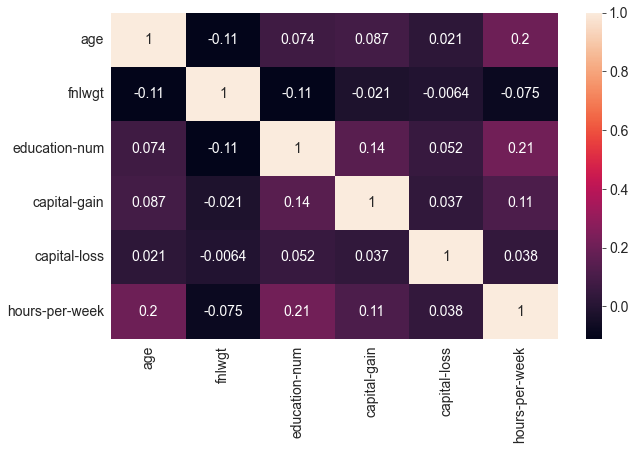

In [ ]:
sns.heatmap(cor,annot=True);

In [ ]:
numeric_cols=(df_train.select_dtypes(include=['int64']))
numeric_cols

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
0,52,98926,9,-3,0,44
1,76,132607,12,7527,0,44
2,40,243258,13,19,0,57
3,76,181259,12,7720,0,44
4,36,115379,13,12,0,58
...,...,...,...,...,...,...
18939,25,174301,12,5,0,39
18940,22,135915,9,16,0,44
18941,47,47276,12,1,1842,39
18942,48,88787,12,-9,0,71


In [ ]:
list(numeric_cols)

['age',
 'fnlwgt',
 'education-num',
 'capital-gain',
 'capital-loss',
 'hours-per-week']

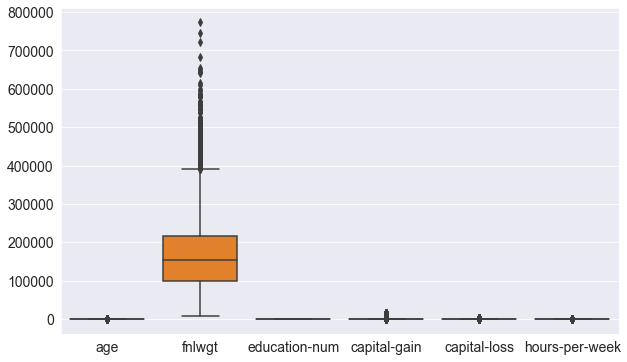

In [ ]:
sns.boxplot(data=numeric_cols);

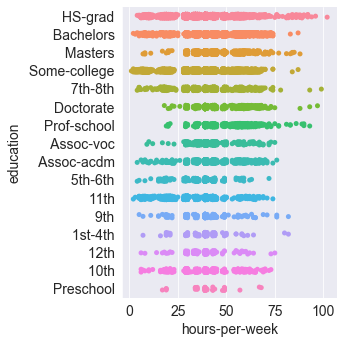

In [ ]:

sns.catplot(y="education", x="hours-per-week", data=df_train);

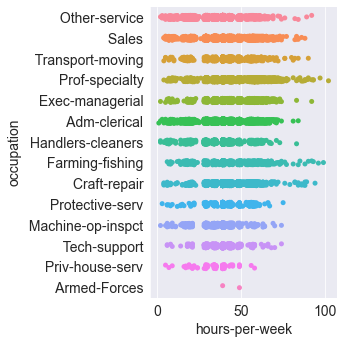

In [ ]:
sns.catplot(y="occupation", x="hours-per-week", data=df_train);

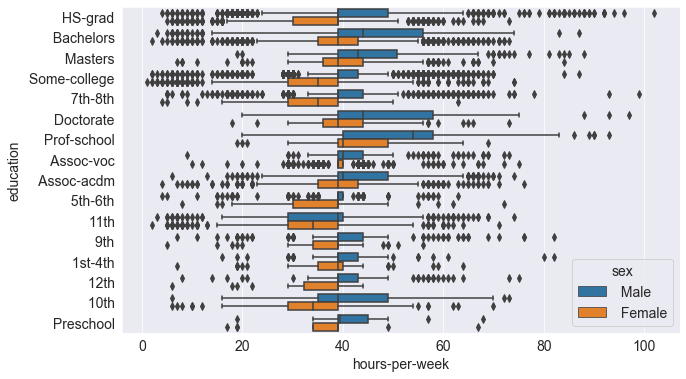

In [ ]:

sns.boxplot(y="education", x="hours-per-week",hue='sex' ,data=df_train);

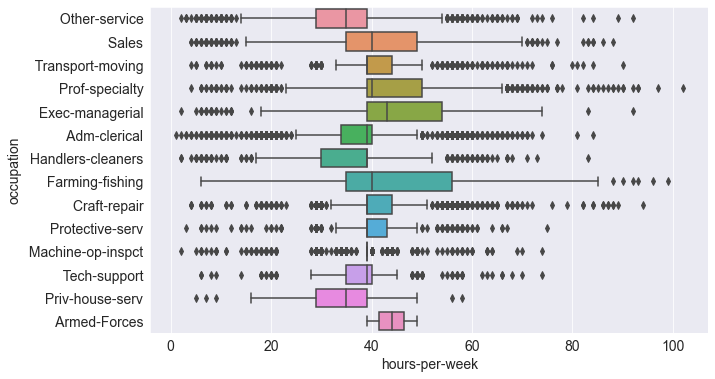

In [ ]:
sns.boxplot(y="occupation", x="hours-per-week", data=df_train);

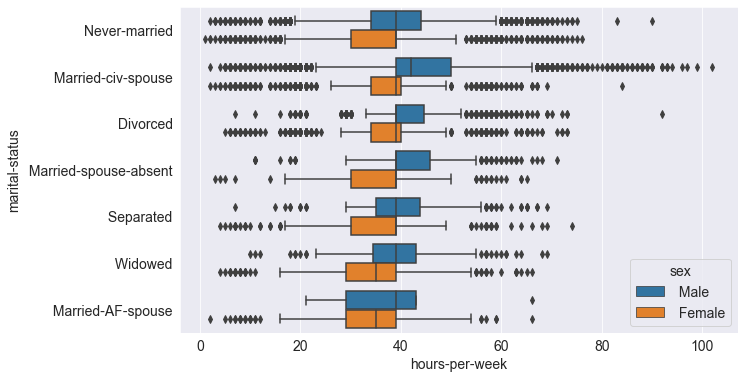

In [ ]:

sns.boxplot(y="marital-status", x="hours-per-week",hue='sex', data=df_train);

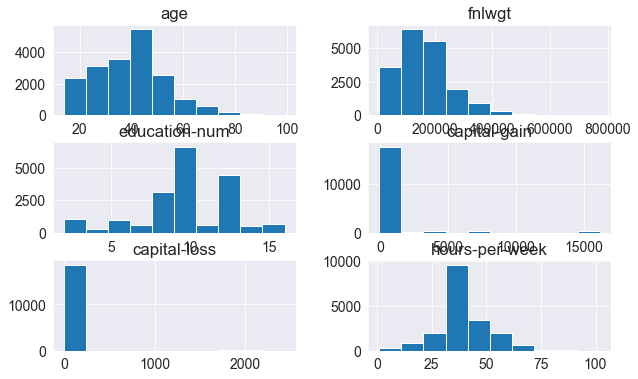

In [ ]:
df_train.hist();

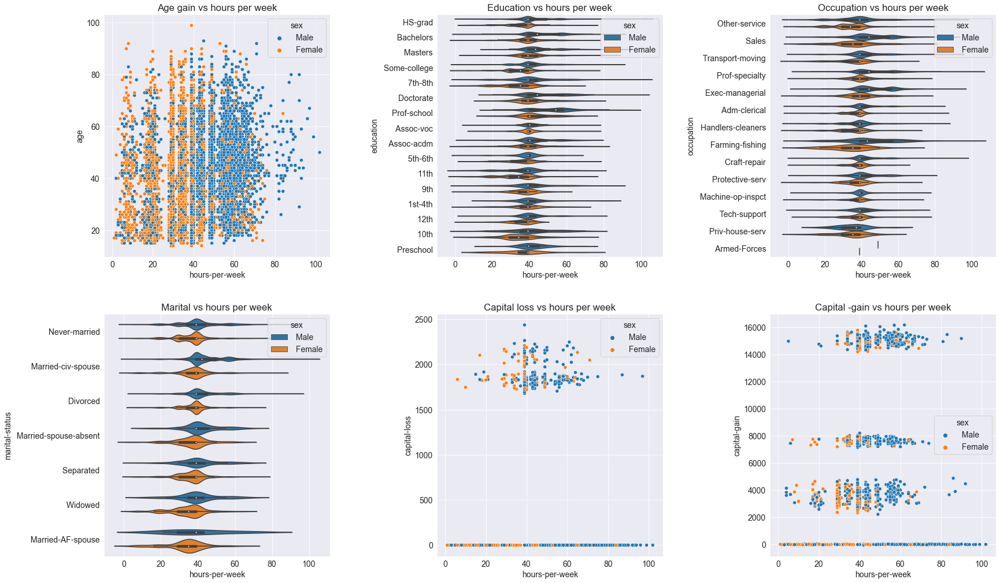

In [ ]:



fig,axes=plt.subplots(2,3,figsize=(25,15))

axes[0,0].set_title('Age gain vs hours per week')
sns.scatterplot(y="age", x="hours-per-week",hue='sex',ax=axes[0,0], data=df_train);



axes[0,1].set_title('Education vs hours per week')
sns.violinplot(y="education", x="hours-per-week",hue='sex',ax=axes[0,1], data=df_train);

axes[0,2].set_title('Occupation vs hours per week')
sns.violinplot(y="occupation", x="hours-per-week",hue='sex',ax=axes[0,2], data=df_train);

axes[1,0].set_title('Marital vs hours per week')
sns.violinplot(y="marital-status", x="hours-per-week",hue='sex',ax=axes[1,0], data=df_train);

axes[1,1].set_title('Capital loss vs hours per week')
sns.scatterplot(y="capital-loss", x="hours-per-week",hue='sex',ax=axes[1,1], data=df_train);


axes[1,2].set_title('Capital -gain vs hours per week')
sns.scatterplot(y="capital-gain", x="hours-per-week",hue='sex',ax=axes[1,2] ,data=df_train);

plt.tight_layout(pad=3);

In [ ]:
def distribution_check(df,Cols):
    plt.figure(figsize=(25,7))
    fig = 1
    i = (len(Cols)//3)+1
    for col in Cols:
        sk = " Skewness : " + str(skew(df_train[col])) +"\nKurtosis :" + str(kurtosis(df_train[col]))
        plt.subplot(i, 3, fig)
        sns.distplot(df[col]).set_title(sk)
        fig = fig+1

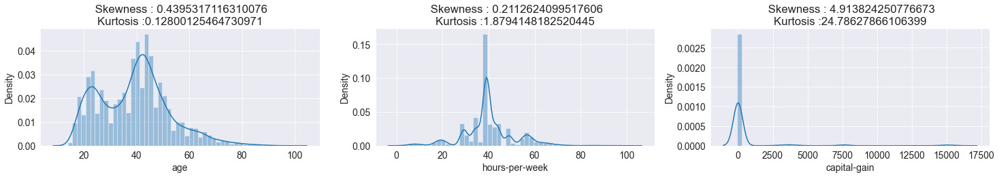

In [ ]:
distribution_check(df_train,['age','hours-per-week','capital-gain'])


In [ ]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [ ]:
from scipy import stats 

In [ ]:
numeric_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   age             18944 non-null  int64
 1   fnlwgt          18944 non-null  int64
 2   education-num   18944 non-null  int64
 3   capital-gain    18944 non-null  int64
 4   capital-loss    18944 non-null  int64
 5   hours-per-week  18944 non-null  int64
dtypes: int64(6)
memory usage: 888.1 KB


In [ ]:
#removing Outliars
z_scores = stats. zscore(numeric_cols) 
abs_z_scores = np. abs(z_scores)
filtered_entries = (abs_z_scores < 3). all(axis=1)
new_df = numeric_cols[filtered_entries]
print(new_df)

       age  fnlwgt  education-num  capital-gain  capital-loss  hours-per-week
0       52   98926              9            -3             0              44
1       76  132607             12          7527             0              44
2       40  243258             13            19             0              57
3       76  181259             12          7720             0              44
4       36  115379             13            12             0              58
...    ...     ...            ...           ...           ...             ...
18938   24  106178             10             2             0              35
18939   25  174301             12             5             0              39
18940   22  135915              9            16             0              44
18942   48   88787             12            -9             0              71
18943   47  175720             13            -1             0              39

[17722 rows x 6 columns]


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             18944 non-null  int64 
 1   workclass       18944 non-null  object
 2   fnlwgt          18944 non-null  int64 
 3   education       18944 non-null  object
 4   education-num   18944 non-null  int64 
 5   marital-status  18944 non-null  object
 6   occupation      18944 non-null  object
 7   relationship    18944 non-null  object
 8   race            18944 non-null  object
 9   sex             18944 non-null  object
 10  capital-gain    18944 non-null  int64 
 11  capital-loss    18944 non-null  int64 
 12  hours-per-week  18944 non-null  int64 
 13  native-country  18944 non-null  object
 14  income          18944 non-null  object
dtypes: int64(6), object(9)
memory usage: 2.2+ MB


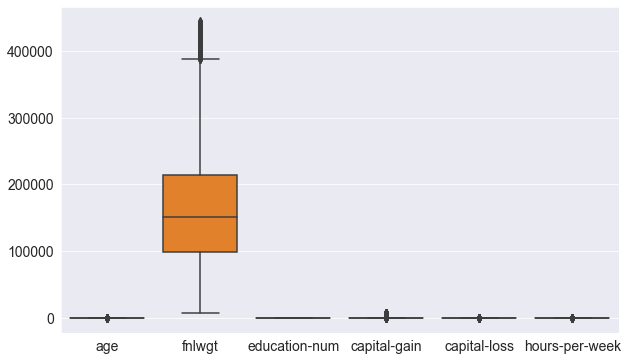

In [ ]:
#Check for Outliars using boxplot

sns.boxplot(data=new_df);

In [ ]:
dataset=df_train.copy()   
dataset

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,52,Private,98926,HS-grad,9,Never-married,Other-service,Unmarried,White,Male,-3,0,44,United-States,<=50K
1,76,Self-emp-not-inc,132607,Bachelors,12,Married-civ-spouse,Sales,Husband,White,Male,7527,0,44,United-States,>50K
2,40,Private,243258,Bachelors,13,Married-civ-spouse,Transport-moving,Husband,Amer-Indian-Eskimo,Male,19,0,57,United-States,>50K
3,76,State-gov,181259,Bachelors,12,Married-civ-spouse,Prof-specialty,Husband,White,Male,7720,0,44,United-States,>50K
4,36,Self-emp-inc,115379,Masters,13,Divorced,Exec-managerial,Not-in-family,White,Male,12,0,58,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18939,25,Private,174301,Bachelors,12,Never-married,Other-service,Not-in-family,White,Female,5,0,39,United-States,<=50K
18940,22,Private,135915,Some-college,9,Never-married,Other-service,Unmarried,White,Female,16,0,44,Canada,<=50K
18941,47,Local-gov,47276,Bachelors,12,Never-married,Adm-clerical,Other-relative,Black,Female,1,1842,39,United-States,<=50K
18942,48,Private,88787,Bachelors,12,Married-civ-spouse,Sales,Husband,Asian-Pac-Islander,Male,-9,0,71,South,<=50K


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
dataset[['sex','income']] = dataset[['sex','income']].apply(LabelEncoder().fit_transform)
dataset[['sex','income']] 

,sex,income
0,1,0
1,1,1
2,1,1
3,1,1
4,1,0
...,...,...
18939,0,0
18940,0,0
18941,0,0
18942,1,0


In [ ]:
dataset['marital-status'].unique()

array([' Never-married', ' Married-civ-spouse', ' Divorced',
       ' Married-spouse-absent', ' Separated', ' Widowed',
       ' Married-AF-spouse'], dtype=object)

In [ ]:
#1) used the map function
dataset["marital-status"] = dataset["marital-status"].replace([' Never-married',' Divorced',' Separated',' Widowed'],0)
dataset["marital-status"] = dataset["marital-status"].replace([' Married-AF-spouse',' Married-civ-spouse', ' Married-spouse-absent'],1)
display(dataset)


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,52,Private,98926,HS-grad,9,0,Other-service,Unmarried,White,1,-3,0,44,United-States,0
1,76,Self-emp-not-inc,132607,Bachelors,12,1,Sales,Husband,White,1,7527,0,44,United-States,1
2,40,Private,243258,Bachelors,13,1,Transport-moving,Husband,Amer-Indian-Eskimo,1,19,0,57,United-States,1
3,76,State-gov,181259,Bachelors,12,1,Prof-specialty,Husband,White,1,7720,0,44,United-States,1
4,36,Self-emp-inc,115379,Masters,13,0,Exec-managerial,Not-in-family,White,1,12,0,58,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18939,25,Private,174301,Bachelors,12,0,Other-service,Not-in-family,White,0,5,0,39,United-States,0
18940,22,Private,135915,Some-college,9,0,Other-service,Unmarried,White,0,16,0,44,Canada,0
18941,47,Local-gov,47276,Bachelors,12,0,Adm-clerical,Other-relative,Black,0,1,1842,39,United-States,0
18942,48,Private,88787,Bachelors,12,1,Sales,Husband,Asian-Pac-Islander,1,-9,0,71,South,0


In [ ]:
dataset["marital-status"]=dataset["marital-status"].astype(int)
dataset.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education-num      int64
marital-status     int32
occupation        object
relationship      object
race              object
sex                int32
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
income             int32
dtype: object

In [ ]:
dataset.drop(labels= ['workclass','education','occupation','relationship','race','native-country'],axis =1, inplace = True)

In [ ]:
y = dataset['hours-per-week']

In [ ]:
y

0        44
1        44
2        57
3        44
4        58
         ..
18939    39
18940    44
18941    39
18942    71
18943    39
Name: hours-per-week, Length: 18944, dtype: int64

In [ ]:
x= dataset.drop('hours-per-week',axis=1)
display(x )

,age,fnlwgt,education-num,marital-status,sex,capital-gain,capital-loss,income
0,52,98926,9,0,1,-3,0,0
1,76,132607,12,1,1,7527,0,1
2,40,243258,13,1,1,19,0,1
3,76,181259,12,1,1,7720,0,1
4,36,115379,13,0,1,12,0,0
...,...,...,...,...,...,...,...,...
18939,25,174301,12,0,0,5,0,0
18940,22,135915,9,0,0,16,0,0
18941,47,47276,12,0,0,1,1842,0
18942,48,88787,12,1,1,-9,0,0


In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split (x,y , test_size = 0.2, random_state= 42)
print (x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(15155, 8) (3789, 8) (15155,) (3789,)


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler_train = MinMaxScaler()
scaler_test = MinMaxScaler()

scaler_train.fit(x_train)   # fit only on train dataset
x_train = scaler_train.fit_transform(x_train)

scaler_test.fit(x_test)   # fit only on test dataset
x_test= scaler_test.transform(x_test)

In [ ]:
import statsmodels.api as sm

In [ ]:
model = sm.OLS(y_train, x_train)
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:         hours-per-week   R-squared (uncentered):                   0.911
Model:                            OLS   Adj. R-squared (uncentered):              0.911
Method:                 Least Squares   F-statistic:                          1.939e+04
Date:                Fri, 01 Oct 2021   Prob (F-statistic):                        0.00
Time:                        16:54:55   Log-Likelihood:                         -59701.
No. Observations:               15155   AIC:                                  1.194e+05
Df Residuals:                   15147   BIC:                                  1.195e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
results.predict(x_test)

array([46.01492359, 47.49218522, 48.35921031, ..., 27.95762458,
       36.72416048, 36.66448297])

In [ ]:
y_test

15024    39
11771    43
16615    42
4201     39
13480    43
         ..
8404     39
5412     56
3755     36
11886    34
13592    17
Name: hours-per-week, Length: 3789, dtype: int64

In [ ]:
df_test

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,native-country,income,hours-per-week
0,40,Without-pay,106899,HS-grad,8,Never-married,Adm-clerical,Own-child,White,Male,0,0,United-States,<=50K,NaN
1,38,Private,157191,HS-grad,8,Married-civ-spouse,Craft-repair,Husband,Black,Male,0,0,United-States,<=50K,NaN
2,76,Self-emp-not-inc,102547,Some-college,10,Widowed,Sales,Not-in-family,Asian-Pac-Islander,Female,32,0,United-States,<=50K,NaN
3,38,Self-emp-not-inc,44426,HS-grad,9,Never-married,Sales,Unmarried,White,Male,30,0,United-States,>50K,NaN
4,62,Without-pay,33230,HS-grad,9,Married-civ-spouse,Sales,Husband,White,Male,-4,0,United-States,<=50K,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8114,30,Private,298018,Bachelors,12,Never-married,Adm-clerical,Other-relative,White,Female,20,0,Mexico,<=50K,NaN
8115,40,Private,186841,10th,6,Never-married,Handlers-cleaners,Unmarried,White,Male,0,0,United-States,<=50K,NaN
8116,44,Private,116414,1st-4th,3,Married-civ-spouse,Craft-repair,Wife,Other,Female,10,0,Honduras,<=50K,NaN
8117,41,Federal-gov,185089,Bachelors,12,Never-married,Machine-op-inspct,Not-in-family,Black,Female,1,0,United-States,<=50K,NaN


In [ ]:
df_test.drop('hours-per-week',axis=1,inplace=True)

In [ ]:
df_test["marital-status"] = df_test["marital-status"].replace([' Never-married',' Divorced',' Separated',' Widowed'],0)
df_test["marital-status"] = df_test["marital-status"].replace([' Married-AF-spouse',' Married-civ-spouse', ' Married-spouse-absent'],1)
display(df_test)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,native-country,income
0,40,Without-pay,106899,HS-grad,8,0,Adm-clerical,Own-child,White,Male,0,0,United-States,<=50K
1,38,Private,157191,HS-grad,8,1,Craft-repair,Husband,Black,Male,0,0,United-States,<=50K
2,76,Self-emp-not-inc,102547,Some-college,10,0,Sales,Not-in-family,Asian-Pac-Islander,Female,32,0,United-States,<=50K
3,38,Self-emp-not-inc,44426,HS-grad,9,0,Sales,Unmarried,White,Male,30,0,United-States,>50K
4,62,Without-pay,33230,HS-grad,9,1,Sales,Husband,White,Male,-4,0,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8114,30,Private,298018,Bachelors,12,0,Adm-clerical,Other-relative,White,Female,20,0,Mexico,<=50K
8115,40,Private,186841,10th,6,0,Handlers-cleaners,Unmarried,White,Male,0,0,United-States,<=50K
8116,44,Private,116414,1st-4th,3,1,Craft-repair,Wife,Other,Female,10,0,Honduras,<=50K
8117,41,Federal-gov,185089,Bachelors,12,0,Machine-op-inspct,Not-in-family,Black,Female,1,0,United-States,<=50K


In [ ]:
df_test["marital-status"]=df_test["marital-status"].astype(int)
dataset.dtypes

age               int64
fnlwgt            int64
education-num     int64
marital-status    int32
sex               int32
capital-gain      int64
capital-loss      int64
hours-per-week    int64
income            int32
dtype: object

In [ ]:
df_test.drop(labels= ['workclass','education','occupation','relationship','race','native-country'],axis =1, inplace = True)

In [ ]:
df_test.income.unique()

array([' <=50K', ' >50K'], dtype=object)

In [ ]:
df_test['income']= df_test['income'].map({" <=50K":0, " >50K":1})
display(df_test)

,age,fnlwgt,education-num,marital-status,sex,capital-gain,capital-loss,income
0,40,106899,8,0,Male,0,0,0
1,38,157191,8,1,Male,0,0,0
2,76,102547,10,0,Female,32,0,0
3,38,44426,9,0,Male,30,0,1
4,62,33230,9,1,Male,-4,0,0
...,...,...,...,...,...,...,...,...
8114,30,298018,12,0,Female,20,0,0
8115,40,186841,6,0,Male,0,0,0
8116,44,116414,3,1,Female,10,0,0
8117,41,185089,12,0,Female,1,0,0


In [ ]:
df_test['sex']= df_test['sex'].map({" Male":0, " Female":1})
display(df_test)

,age,fnlwgt,education-num,marital-status,sex,capital-gain,capital-loss,income
0,40,106899,8,0,0,0,0,0
1,38,157191,8,1,0,0,0,0
2,76,102547,10,0,1,32,0,0
3,38,44426,9,0,0,30,0,1
4,62,33230,9,1,0,-4,0,0
...,...,...,...,...,...,...,...,...
8114,30,298018,12,0,1,20,0,0
8115,40,186841,6,0,0,0,0,0
8116,44,116414,3,1,1,10,0,0
8117,41,185089,12,0,1,1,0,0


In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   age             8119 non-null   int64
 1   fnlwgt          8119 non-null   int64
 2   education-num   8119 non-null   int64
 3   marital-status  8119 non-null   int32
 4   sex             8119 non-null   int64
 5   capital-gain    8119 non-null   int64
 6   capital-loss    8119 non-null   int64
 7   income          8119 non-null   int64
dtypes: int32(1), int64(7)
memory usage: 475.8 KB


In [ ]:
from sklearn.preprocessing import MinMaxScaler
min_max_sc = MinMaxScaler()
df_test=min_max_sc.fit_transform(df_test)

In [ ]:
df_test_predict=results.predict(df_test)

In [ ]:
predictions=df_test_predict

In [ ]:
prediction = pd.DataFrame(predictions, columns=['hours-per-week']).to_csv('prediction.csv')